In [ ]:
# End to end Multi-class Dog breed classification

#This notebook builds an end-to-end multi-class image classifier using TensorFlow Hub

## 1. Problem

# Identifying the breed of a dog given an image of a dog
# when i am sitting at the cafe and i take a photo of a dog, i want to knowwhat breed it is

In [ ]:
### Get our workspace ready 

In [ ]:
import tensorflow as tf
print('Tf version:', tf.__version__)

Tf version: 2.9.2


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.9.2
Hub version: 0.12.0
GPU available (YESS!!!!)


## getting data ready (turning into Tensors)
turning images into tenses.
lets start by accessing our data and checking out the labels

In [ ]:
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


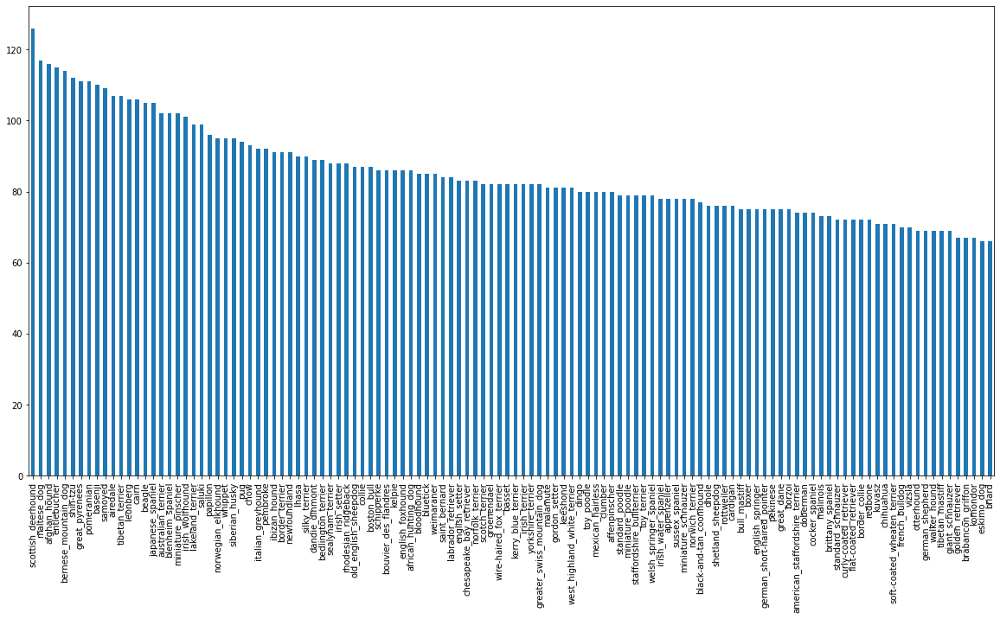

In [ ]:
# How many images are there of each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

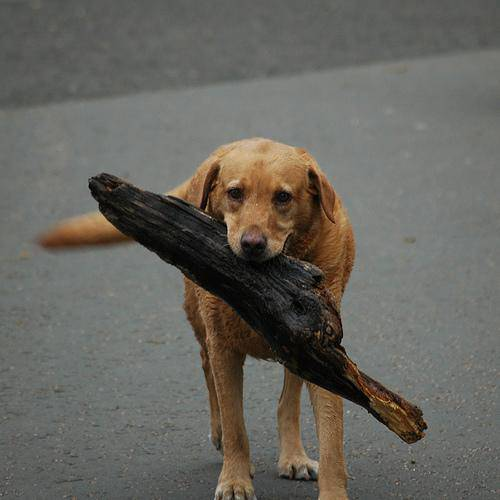

In [ ]:
#Lets view and image
from IPython.display import Image
Image('/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg')

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from images IDs
filepaths =['/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/'+ fname + '.jpg' for fname in labels_csv['id']]
#checking the first 10
filepaths[:10]

['/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped File

In [ ]:
# check whether number of files names matches number of actual image files
import os
if len(os.listdir('/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/')) == len(filepaths):
  print('filepaths match actual amount of files!!! Proceed.')
else:
  print('filepaths do not match actual amount of files, check the target directory.')

filepaths match actual amount of files!!! Proceed.


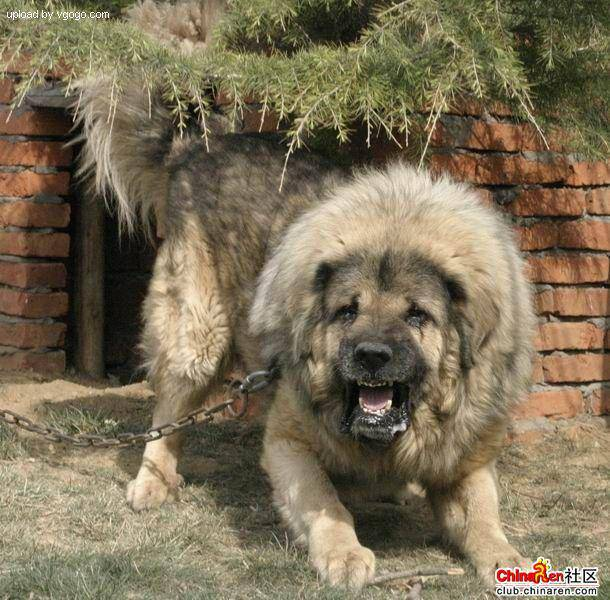

In [ ]:
# One more check
Image(filepaths[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels =  labels_csv['breed'].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filepaths):
  print('Number of labels matches number of filepaths')
else:
  print('Number of labels does not match number of filepaths, check target directories')

Number of labels matches number of filepaths


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs 

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filepaths[:10]

['/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped File

## Creating a validation set

In [ ]:
X = filepaths
y = boolean_labels

len(filepaths)

10222

## We are going to start off experimenting 1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:1000}

In [ ]:
#lets split our data into train and validation sets
from sklearn.model_selection import train_test_split


# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets have a geez at the training data
X_train[:4], y_train[:3]

(['/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

##Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we are going to write a function which does a few things:


1.   Take an image filepath as input
2.   Use TensorFlow to read the file and save it to a variable, 'image'
3.   Turn our 'image' (a jpg) into Tensors
4.   Resize the image to be a shape of (224, 224)
5.   Return the modified 'image'




In [ ]:
# convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filepaths[33])
image.shape

(500, 443, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
image[:2]

array([[[203, 203, 201],
        [187, 187, 185],
        [184, 184, 182],
        ...,
        [ 84,  74,  38],
        [ 88,  79,  40],
        [ 85,  76,  35]],

       [[163, 163, 161],
        [212, 212, 210],
        [163, 163, 161],
        ...,
        [ 80,  70,  34],
        [ 86,  77,  38],
        [ 86,  77,  36]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 443, 3), dtype=uint8, numpy=
array([[[203, 203, 201],
        [187, 187, 185],
        [184, 184, 182],
        ...,
        [ 84,  74,  38],
        [ 88,  79,  40],
        [ 85,  76,  35]],

       [[163, 163, 161],
        [212, 212, 210],
        [163, 163, 161],
        ...,
        [ 80,  70,  34],
        [ 86,  77,  38],
        [ 86,  77,  36]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

Creating data batches


What's a batch?

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

TensorFlow is very efficient when your data is in batches of (image, label) Tensors.
So we'll build a function to do create those first. We'll take advantage of of process_image function at the same time.


In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the above
(process_image(X[42]),  tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Visualizing Data Batches
Data in batches can be a little hard to understand. lets visualize the data batches.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

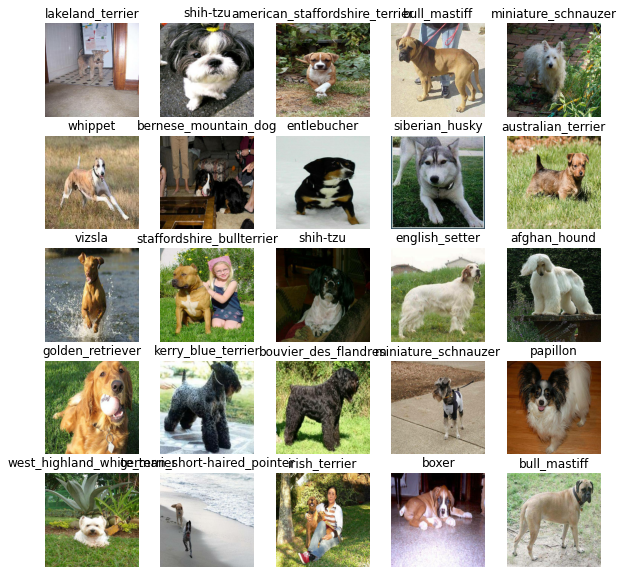

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

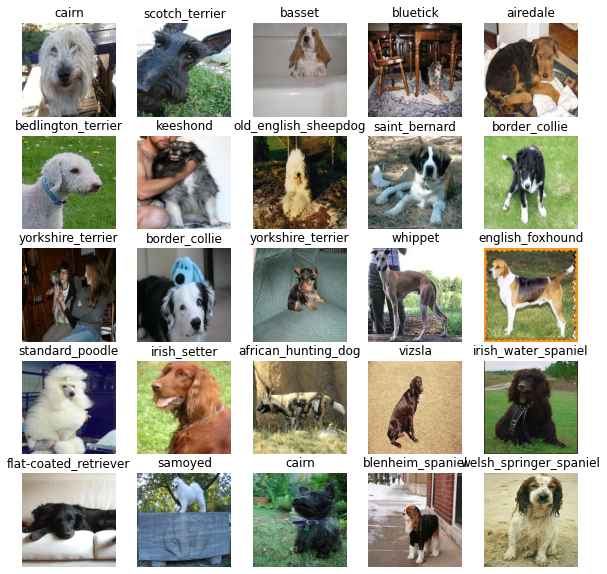

In [ ]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setopmodel URL from TENSORFLOW Hub
Model_URL  = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
     # Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=Model_URL):
  print("Building model with:", Model_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(Model_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

TensorBoard Callback
TensorBoard helps provide a visual way to monitor the progress of your model during and after training.

It can be used directly in a notebook to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

Load the TensorBoard notebook extension.
Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
22# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

In [ ]:

# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 140s 5s/step - loss: 4.6063 - accuracy: 0.0862 - val_loss: 3.5067 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 3s 128ms/step - loss: 1.6603 - accuracy: 0.6675 - val_loss: 2.2343 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 3s 128ms/step - loss: 0.5816 - accuracy: 0.9400 - val_loss: 1.7268 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 153ms/step - loss: 0.2617 - accuracy: 0.9887 - val_loss: 1.5325 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 153ms/step - loss: 0.1493 - accuracy: 0.9987 - val_loss: 1.4417 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 152ms/step - loss: 0.1018 - accuracy: 1.0000 - val_loss: 1.3904 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

In [ ]:
## Checking the TensorBoard logs

In [ ]:
%tensorboard --logdir drive/My\ Drive/Data/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 99ms/step


array([[8.2256465e-04, 6.5987828e-05, 9.3394186e-04, ..., 2.9532053e-04,
        2.0026131e-05, 1.1569319e-03],
       [7.3086802e-04, 1.8243955e-03, 5.7072315e-02, ..., 1.3356407e-04,
        1.1412617e-03, 1.4818963e-04],
       [7.4152526e-06, 7.4021009e-05, 2.2330580e-05, ..., 3.3094235e-05,
        2.1355940e-05, 1.9250503e-04],
       ...,
       [2.4280839e-06, 9.5136966e-06, 4.2911313e-05, ..., 1.3223799e-05,
        1.4459866e-04, 9.9131881e-05],
       [7.3509044e-03, 6.6442951e-04, 9.4205723e-05, ..., 3.3728601e-04,
        1.4460790e-04, 4.7973017e-03],
       [1.2811556e-03, 2.5929190e-05, 4.9907761e-03, ..., 2.4542099e-02,
        6.9447083e-04, 1.3957110e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
predictions[0]

array([8.22564645e-04, 6.59878278e-05, 9.33941861e-04, 1.71066949e-05,
       1.94946668e-04, 6.35212054e-05, 9.72338580e-03, 1.60199788e-03,
       1.58294759e-04, 9.29175876e-04, 1.09336506e-04, 5.47063770e-04,
       1.77349357e-04, 4.98848131e-05, 2.52282742e-04, 1.78731454e-04,
       4.95109816e-06, 1.06273428e-01, 1.71715037e-05, 1.31317589e-04,
       1.47278700e-03, 9.32286566e-05, 2.52919435e-05, 2.39029713e-03,
       1.71310858e-05, 4.94774664e-04, 7.71793425e-02, 4.25757389e-05,
       8.86552385e-04, 3.73890740e-04, 5.12182654e-04, 8.06091994e-04,
       1.58735423e-03, 1.65213442e-05, 2.20476777e-05, 9.41264071e-03,
       8.49573335e-05, 1.66380109e-04, 9.52071496e-05, 1.50257722e-04,
       3.98733071e-04, 6.36770274e-05, 5.21158108e-05, 7.34574351e-05,
       3.72907525e-04, 2.20652018e-05, 5.96895870e-06, 1.18901735e-04,
       3.54416552e-04, 1.74899280e-04, 6.82870159e-05, 6.66624037e-05,
       2.72260295e-05, 9.35680146e-05, 5.06184151e-05, 6.76006630e-06,
      

In [ ]:
np.sum(predictions[0])

In [78]:
# First prediction
index = 42
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[8.22564645e-04 6.59878278e-05 9.33941861e-04 1.71066949e-05
 1.94946668e-04 6.35212054e-05 9.72338580e-03 1.60199788e-03
 1.58294759e-04 9.29175876e-04 1.09336506e-04 5.47063770e-04
 1.77349357e-04 4.98848131e-05 2.52282742e-04 1.78731454e-04
 4.95109816e-06 1.06273428e-01 1.71715037e-05 1.31317589e-04
 1.47278700e-03 9.32286566e-05 2.52919435e-05 2.39029713e-03
 1.71310858e-05 4.94774664e-04 7.71793425e-02 4.25757389e-05
 8.86552385e-04 3.73890740e-04 5.12182654e-04 8.06091994e-04
 1.58735423e-03 1.65213442e-05 2.20476777e-05 9.41264071e-03
 8.49573335e-05 1.66380109e-04 9.52071496e-05 1.50257722e-04
 3.98733071e-04 6.36770274e-05 5.21158108e-05 7.34574351e-05
 3.72907525e-04 2.20652018e-05 5.96895870e-06 1.18901735e-04
 3.54416552e-04 1.74899280e-04 6.82870159e-05 6.66624037e-05
 2.72260295e-05 9.35680146e-05 5.06184151e-05 6.76006630e-06
 1.33988215e-04 4.28143423e-03 1.11759538e-04 8.45190287e-02
 4.23529465e-03 4.60560768e-05 7.16655981e-04 1.68937931e-05
 3.22071370e-04 3.463533

In [79]:
unique_breeds[103]

'soft-coated_wheaten_terrier'

In [80]:
# Turn prediction probabilities into their respective label 
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[92])
pred_label

'yorkshire_terrier'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [84]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "red"
  else:
    color = "blue"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

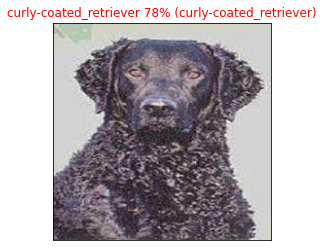

In [85]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=76)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

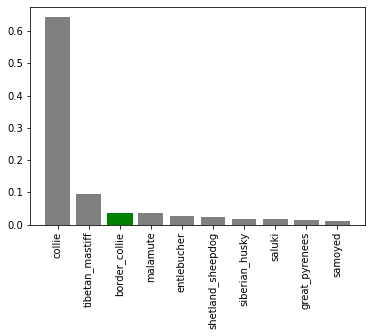

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

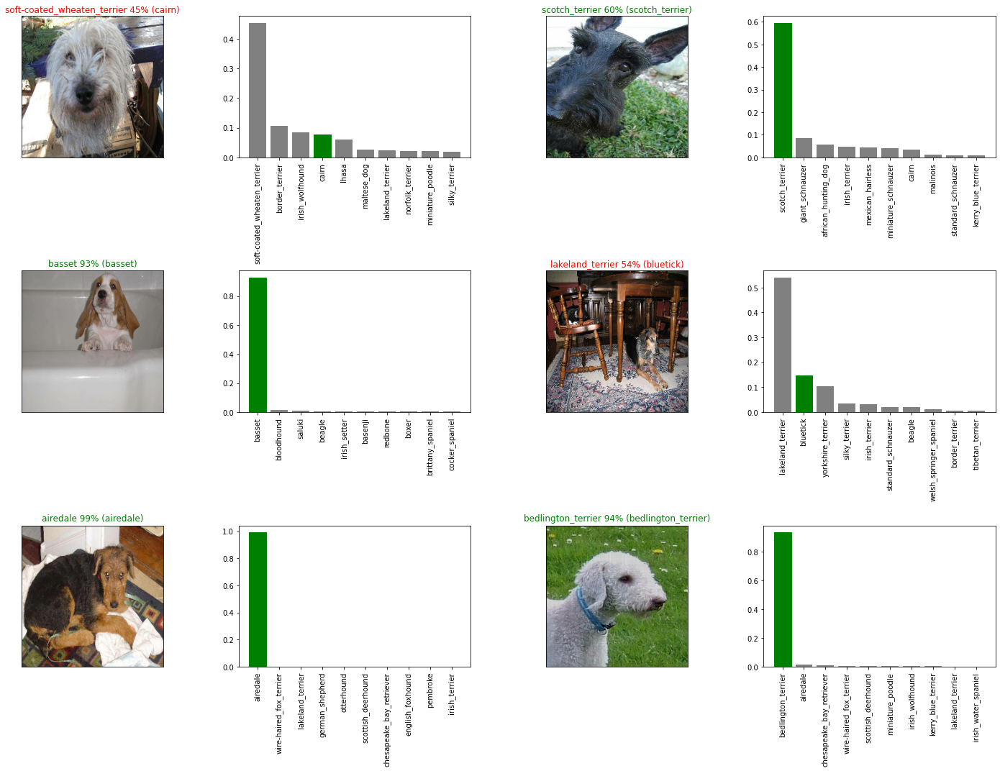

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Saving and reloading a model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20221018-08371666082225-1000-images-Adam.h5...


'drive/My Drive/Data/models/20221018-08371666082225-1000-images-Adam.h5'

In [86]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/My Drive/Data/models/20221018-08371666082225-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/Data/models/20221018-08371666082225-1000-images-Adam.h5


In [92]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.2870 - accuracy: 0.6500


[1.2870222330093384, 0.6499999761581421]

In [91]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.2870 - accuracy: 0.6500


[1.2870222330093384, 0.6499999761581421]

Training a Big Dog model: (on the full data)

In [90]:
len(X), len(y)

(10222, 10222)

In [93]:
# Create a data batch with full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [94]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [95]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [99]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training onall the data,so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [100]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 124ms/step - loss: 1.3144 - accuracy: 0.6746
Epoch 2/100
320/320 [==============================] - 37s 116ms/step - loss: 0.3940 - accuracy: 0.8864
Epoch 3/100
320/320 [==============================] - 37s 117ms/step - loss: 0.2329 - accuracy: 0.9365
Epoch 4/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1531 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 46s 144ms/step - loss: 0.1066 - accuracy: 0.9762
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0757 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0586 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0457 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0368 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 42s 131m

In [102]:
save_model(full_model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20221018-11281666092497-1000-images-Adam.h5...


'drive/My Drive/Data/models/20221018-11281666092497-1000-images-Adam.h5'

In [103]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Data/models/20221018-11281666092497-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/Data/models/20221018-11281666092497-1000-images-Adam.h5


In [104]:
## Making prediction on the test dataset
# Load test image filenames
test_path = '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/'
test_filenames = [test_path + fname  for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e83f4c0ff6dec86d89d0f8b70ecd3cea.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e83d7fa8fdfba0ec577f9c8df811d439.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e8505566fd9116b812e306ca196b62da.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e83fec66a32873298df9fa5fdac113aa.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e850770a6575a34b1c7ad4b401692553.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e85291fc6ba44e39defc7769fa020646.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test/e857866af777793d2c114b09ea7a685a.jpg',
 '/content/drive/MyDrive/Dog-vision/dog-breed-identification (2).zip (Unzipped Files)/test

In [105]:
len(test_filenames)

10357

In [106]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [107]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make Prediction on test data batch using the loaded full model
test_predicitions = loaded_full_model.predict(test_data,
                                              verbose=1)

142/324 [============>.................] - ETA: 24:02

In [ ]:
#save predictions (Numpy array) to csv file (for access later)
#np.savetxt('drive/My Drive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predicitions (Numpy array) from csv file
test_predictions = np.loadtxt('drive/My Drive/Dog Vision/preds_array.csv', delimiter=',')